In [47]:
import meep as mp
from meep.materials import Al
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython.display import Image, display
import imageio
from meep_material import lorentzfit
import nlopt

In [48]:
def Material_fit(Material_data_csv=".", 
                   eps_inf=1,
                   fit_wl_min=0.38, fit_wl_max=0.72,
                   num_lorentzians=2, iteration=30
                       ):    
        # 1. 데이터 로드 및 전처리,
        data = np.genfromtxt(Material_data_csv, delimiter=",")
        wl = data[:, 0] * 1e6  # 파장 (µm),
        n_data = data[:, 1] + 1j * data[:, 2]
        eps_all = np.square(n_data) - eps_inf
    
        # 피팅 범위로 데이터 선택,
        mask = (wl >= fit_wl_min) & (wl <= fit_wl_max)
        wl_fit, eps_fit = wl[mask], eps_all[mask]
        freqs_fit = 1 / wl_fit
    
        # 2. Lorentzian 피팅 최적화,
        ps = np.zeros((iteration, 3 * num_lorentzians))
        errors = np.zeros(iteration)
        for m in range(iteration):
            p_rand = [10 ** np.random.random() for _ in range(3 * num_lorentzians)]
            ps[m, :], errors[m] = lorentzfit(p_rand, freqs_fit, eps_fit, nlopt.LD_MMA, 1e-25, 50000)
            print(f"Iteration {m:3d}, error: {errors[m]:.6f}")
        best = np.argmin(errors)
        print(f"Optimal error: {errors[best]:.6f}")
    
        # 3. 최적 파라미터로 Susceptibility 생성 및 Meep 모델 구성,
        suscept = []
        for i in range(num_lorentzians):
            freq_param = ps[best][3*i + 1]
            gamma = ps[best][3*i + 2]
            if freq_param == 0:
                sigma = ps[best][3*i + 0]
                suscept.append(mp.DrudeSusceptibility(frequency=1.0, gamma=gamma, sigma=sigma))
            else:
                sigma = ps[best][3*i + 0] / freq_param**2
                suscept.append(mp.LorentzianSusceptibility(frequency=freq_param, gamma=gamma, sigma=sigma))
    
        return eps_inf, suscept

al_data_path   = "/home/m2ni/EIDL/Tool/Meep/LGD/Material CSV/Al_Palik/Data/CSV file/Al_Palik/CSV/Al_palik_data.csv"
eps_inf_al, suscept_al = Material_fit(Material_data_csv=al_data_path)
Al = mp.Medium(epsilon = eps_inf_al, E_susceptibilities = suscept_al)

Iteration   0, error: 64.226780
Iteration   1, error: 64.226780
Iteration   2, error: 71292.592314
Iteration   3, error: 64.226780
Iteration   4, error: 71292.592314
Iteration   5, error: 64.226780
Iteration   6, error: 54.483567
Iteration   7, error: 54.483567
Iteration   8, error: 3.131232
Iteration   9, error: 64.226780
Iteration  10, error: 64.226780
Iteration  11, error: 64.226780
Iteration  12, error: 3.397856
Iteration  13, error: 54.483567
Iteration  14, error: 64.226780
Iteration  15, error: 64.226780
Iteration  16, error: 54.483567
Iteration  17, error: 54.483567
Iteration  18, error: 64.226780
Iteration  19, error: 54.483567
Iteration  20, error: 64.226780
Iteration  21, error: 3.131232
Iteration  22, error: 64.226780
Iteration  23, error: 64.226780
Iteration  24, error: 64.226780
Iteration  25, error: 64.226780
Iteration  26, error: 64.226780
Iteration  27, error: 71292.592314
Iteration  28, error: 64.226780
Iteration  29, error: 64.226780
Optimal error: 3.131232


In [49]:
resolution = 50

cell_size = mp.Vector3(30,4,0)

lambda_min = 0.4
lambda_max = 0.7

fmin = 1 / lambda_max
fmax = 1 / lambda_min

fcen = 0.5 * (fmin + fmax)
df = fmax - fmin

In [50]:
sources = [
    mp.Source(
        mp.ContinuousSource(frequency=fcen),
        component=mp.Ex,
        center=mp.Vector3(0,0,0),
    )
]

In [51]:
pml_layers = [
    mp.PML(thickness=0.5, direction=mp.X, side=mp.Low),  # 좌측 PML
    mp.PML(thickness=0.5, direction=mp.X, side=mp.High), # 우측 PML
    mp.PML(thickness=0.5, direction=mp.Y, side=mp.High), # 상단 PML
    mp.PML(thickness=0.5, direction=mp.Y, side=mp.Low), # 상단 PML
]

In [52]:
alq3_center = 0
Al_center = -1.25

alq3_index = mp.Medium(index = 1.68)

geometry = [
    mp.Block(
        size = mp.Vector3(mp.inf, 2.5, mp.inf),
        center=mp.Vector3(0,0.25,0),
        material=alq3_index,
    ),
    mp.Block(
        size = mp.Vector3(mp.inf, 0.5, mp.inf),
        center = mp.Vector3(0, -1.25, 0),
        material = Al
    )
]

sim = mp.Simulation(
    cell_size=cell_size,
    sources=sources,
    geometry=geometry,
    resolution=resolution,
    default_material=mp.Medium(index = 1),
    boundary_layers=pml_layers
)

In [53]:
flux_size = 1
offset = 0.5
# 상단 monitor
top_monitor = sim.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( 0, offset, 0), 
                                         size = mp.Vector3( flux_size, 0, 0))
)

# 좌측 monitor
left_monitor = sim.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( -offset, 0, 0), 
                                         size = mp.Vector3( 0, flux_size, 0))
)

# 하단 monitor
bottom_monitor = sim.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( 0, -offset, 0), 
                                         size = mp.Vector3( flux_size, 0, 0))
)


# 우측 monitor
right_monitor = sim.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( offset, 0, 0), 
                                         size = mp.Vector3( 0, flux_size, 0))
)


     block, center = (0,0.25,0)
          size (1e+20,2.5,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.8224,2.8224,2.8224)
     block, center = (0,-1.25,0)
          size (1e+20,0.5,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)


<Axes: xlabel='X', ylabel='Y'>

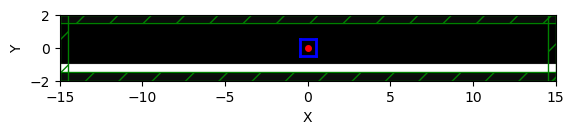

In [54]:
sim.plot2D()

-----------
Initializing structure...
time for choose_chunkdivision = 0.000469923 s
Working in 2D dimensions.
Computational cell is 30 x 4 x 0 with resolution 50
     block, center = (0,0.25,0)
          size (1e+20,2.5,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.8224,2.8224,2.8224)
     block, center = (0,-1.25,0)
          size (1e+20,0.5,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
time for set_epsilon = 0.306431 s
drude susceptibility: frequency=1, gamma=0
lorentzian susceptibility: frequency=1.01629, gamma=0.899161
-----------


/tmp/ipykernel_3864/2128625317.py:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


Meep progress: 7.97/200.0 = 4.0% done in 4.0s, 96.4s to go
on time step 797 (time=7.97), 0.00502058 s/step
Meep progress: 15.69/200.0 = 7.8% done in 8.0s, 94.0s to go
on time step 1569 (time=15.69), 0.00518415 s/step
Meep progress: 23.38/200.0 = 11.7% done in 12.0s, 90.7s to go
on time step 2338 (time=23.38), 0.00520514 s/step
Meep progress: 31.0/200.0 = 15.5% done in 16.0s, 87.4s to go
on time step 3100 (time=31), 0.00527905 s/step
Meep progress: 38.17/200.0 = 19.1% done in 20.0s, 84.9s to go
on time step 3817 (time=38.17), 0.00558396 s/step
Meep progress: 46.0/200.0 = 23.0% done in 24.2s, 80.9s to go
on time step 4600 (time=46), 0.00527451 s/step
Meep progress: 53.88/200.0 = 26.9% done in 28.2s, 76.4s to go
on time step 5388 (time=53.88), 0.00507769 s/step
Meep progress: 61.550000000000004/200.0 = 30.8% done in 32.2s, 72.4s to go
on time step 6155 (time=61.55), 0.00521602 s/step
Meep progress: 69.27/200.0 = 34.6% done in 36.2s, 68.3s to go
on time step 6927 (time=69.27), 0.00518243 s

/tmp/ipykernel_3864/2128625317.py:36: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(fname))


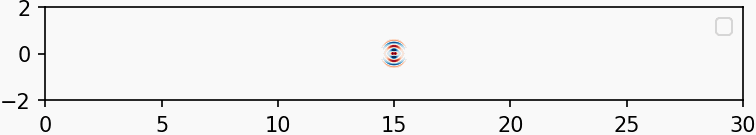

In [55]:
# === 이미지 저장용 디렉토리 생성 ===
output_dir = "frames"
os.makedirs(output_dir, exist_ok=True)

# === 프레임 저장 함수 ===
frame_idx = 0

def save_frame(sim):
    global frame_idx
    field = sim.get_array(component=mp.Ex, center=mp.Vector3(), size=cell_size)

    plt.figure(figsize=(6, 2))
    plt.imshow(field.T, cmap='RdBu', interpolation='spline36', origin='lower',
               vmin=-1, vmax=1, extent=(0, cell_size.x, -cell_size.y/2, cell_size.y/2))

    

    # 범례 (선택사항: 최초 프레임에서만 보기 좋음)
    if frame_idx == 0:
        plt.legend(loc='upper right')

    fname = os.path.join(output_dir, f"frame_{frame_idx:03d}.png")
    plt.savefig(fname, dpi=150, bbox_inches='tight', pad_inches=0)
    plt.close()
    frame_idx += 1



# === 시뮬레이션 실행 ===
sim.run(mp.at_every(1.0, save_frame), until=200)

# === gif 생성 ===
images = []
for i in range(frame_idx):
    fname = os.path.join(output_dir, f"frame_{i:03d}.png")
    images.append(imageio.imread(fname))

gif_path = "wave_propagation.gif"
imageio.mimsave(gif_path, images, fps=5)

# === IPython으로 결과 출력 ===
display(Image(filename=gif_path))

In [56]:
sim.init_sim()
resolution = 50

cell_size = mp.Vector3(30,4,0)

lambda_min = 0.4
lambda_max = 0.7

fmin = 1 / lambda_max
fmax = 1 / lambda_min

fcen = 0.5 * (fmin + fmax)
df = fmax - fmin

sources = [
    mp.Source(
        mp.ContinuousSource(frequency=fcen),
        component=mp.Ex,
        center=mp.Vector3(0,0,0),
    )
]

pml_layers = [
    mp.Absorber(thickness=0.5, direction=mp.X, side=mp.Low),  # 좌측 Absorber
    mp.Absorber(thickness=0.5, direction=mp.X, side=mp.High), # 우측 Absorber
    mp.Absorber(thickness=0.5, direction=mp.Y, side=mp.High), # 상단 Absorber
    mp.Absorber(thickness=0.5, direction=mp.Y, side=mp.Low), # 상단 Absorber
]

alq3_center = 0
Al_center = -1.25

alq3_index = mp.Medium(index = 1.68)

geometry = [
    mp.Block(
        size = mp.Vector3(mp.inf, 2.5, mp.inf),
        center=mp.Vector3(0,0.25,0),
        material=alq3_index,
    ),
    mp.Block(
        size = mp.Vector3(mp.inf, 0.5, mp.inf),
        center = mp.Vector3(0, -1.25, 0),
        material = Al
    )
]

sim_absorber = mp.Simulation(
    cell_size=cell_size,
    sources=sources,
    geometry=geometry,
    resolution=resolution,
    default_material=mp.Medium(index = 1),
    boundary_layers=pml_layers
)

flux_size = 1
offset = 0.5
# 상단 monitor_absorber
top_monitor_absorber = sim_absorber.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( 0, offset, 0), 
                                         size = mp.Vector3( flux_size, 0, 0))
)

# 좌측 monitor_absorber
left_monitor_absorber = sim_absorber.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( -offset, 0, 0), 
                                         size = mp.Vector3( 0, flux_size, 0))
)

# 하단 monitor_absorber
bottom_monitor_absorber = sim_absorber.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( 0, -offset, 0), 
                                         size = mp.Vector3( flux_size, 0, 0))
)


# 우측 monitor_absorber
right_monitor_absorber = sim_absorber.add_flux(fcen, df, 100, 
                           mp.FluxRegion(center = mp.Vector3( offset, 0, 0), 
                                         size = mp.Vector3( 0, flux_size, 0))
)

-----------
Initializing structure...
time for choose_chunkdivision = 1.09673e-05 s
Working in 2D dimensions.
Computational cell is 30 x 4 x 0 with resolution 50
     block, center = (0,0.25,0)
          size (1e+20,2.5,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.8224,2.8224,2.8224)
     block, center = (0,-1.25,0)
          size (1e+20,0.5,1e+20)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (1,1,1)
time for set_epsilon = 0.306671 s
time for set_conductivity = 0.00982785 s
time for set_conductivity = 0.00992703 s
time for set_conductivity = 0.0106502 s
time for set_conductivity = 0.00978804 s
time for set_conductivity = 0.00989413 s
time for set_conductivity = 0.00984383 s
drude susceptibility: frequency=1, gamma=0
lorentzian susceptibility: frequency=1.01629, gamma=0.899161
-----------
Meep progress: 7.04/200.0 = 3.5% done in 4.0s, 109.7s to go
on time step 704 (time=7.04), 0.00568602 

/tmp/ipykernel_3864/1494913826.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images_absorber.append(imageio.imread(fname))


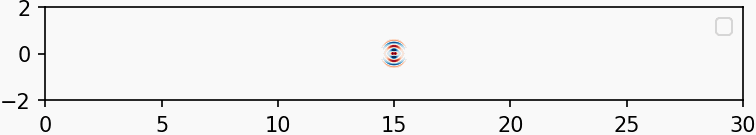

In [57]:
# === 시뮬레이션 실행 ===
sim_absorber.run(mp.at_every(1.0, save_frame), until=200)

# === gif 생성 ===
images_absorber = []
for i in range(frame_idx):
    fname = os.path.join(output_dir, f"frame_{i:03d}.png")
    images_absorber.append(imageio.imread(fname))

gif_path = "wave_propagation_absorber.gif"
imageio.mimsave(gif_path, images_absorber, fps=5)

# === IPython으로 결과 출력 ===
display(Image(filename=gif_path))

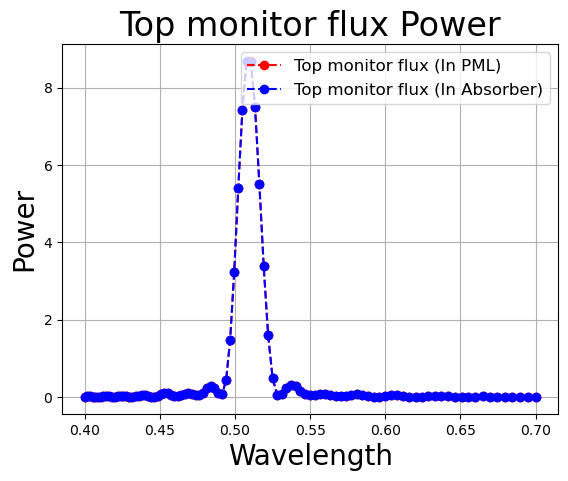

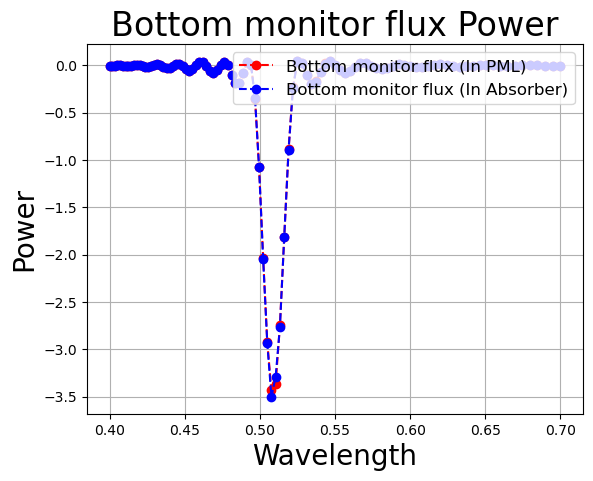

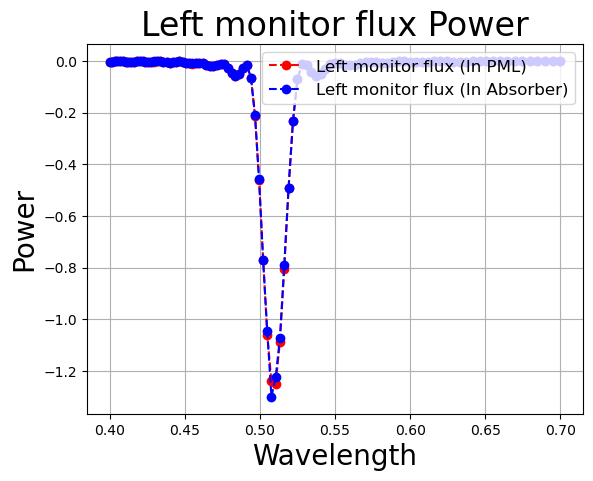

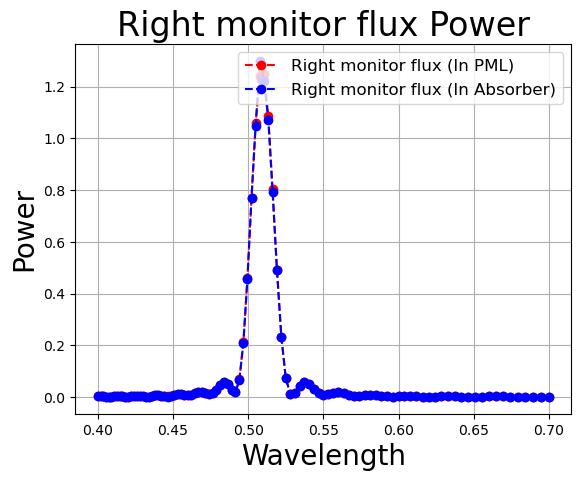

In [58]:
# frequency & wavelengths
frequency = mp.get_flux_freqs(top_monitor)
wavelength = 1 / np.array(frequency)

# flux data
top_flux = mp.get_fluxes(top_monitor)
bottom_flux = mp.get_fluxes(bottom_monitor)
left_flux = mp.get_fluxes(left_monitor)
right_flux = mp.get_fluxes(right_monitor)

top_flux_abs = mp.get_fluxes(top_monitor_absorber)
bottom_flux_abs = mp.get_fluxes(bottom_monitor_absorber)
left_flux_abs = mp.get_fluxes(left_monitor_absorber)
right_flux_abs = mp.get_fluxes(right_monitor_absorber)

# ──────────────────── 공통 설정 ────────────────────
def plot_flux_comparison(wavelength, flux_pml, flux_abs, title):
    plt.figure()
    plt.plot(wavelength, flux_pml, 'o--', label=f'{title} (In PML)', color='red')
    plt.plot(wavelength, flux_abs, 'o--', label=f'{title} (In Absorber)', color='blue')
    plt.title(f'{title} Power', fontsize=24)
    plt.xlabel("Wavelength", fontsize=20)
    plt.ylabel("Power", fontsize=20)
    plt.legend(loc='upper right', fontsize=12)
    plt.grid(True)
    plt.show()

# ──────────────────── 방향별 그래프 출력 ────────────────────
plot_flux_comparison(wavelength, top_flux, top_flux_abs, 'Top monitor flux')
plot_flux_comparison(wavelength, bottom_flux, bottom_flux_abs, 'Bottom monitor flux')
plot_flux_comparison(wavelength, left_flux, left_flux_abs, 'Left monitor flux')
plot_flux_comparison(wavelength, right_flux, right_flux_abs, 'Right monitor flux')

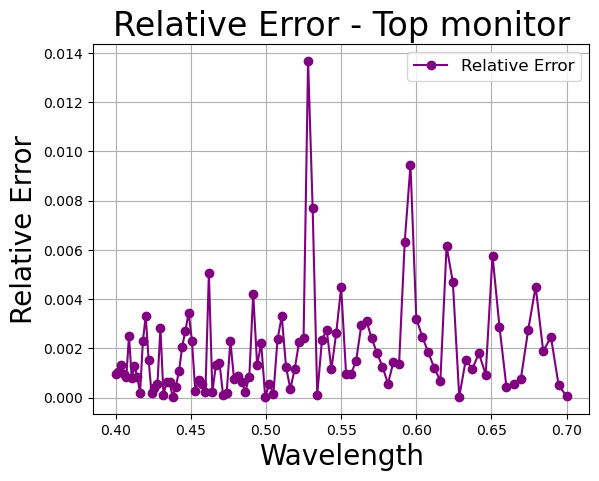

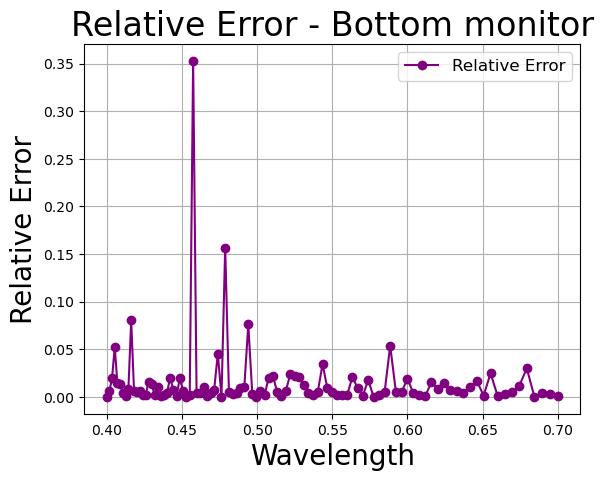

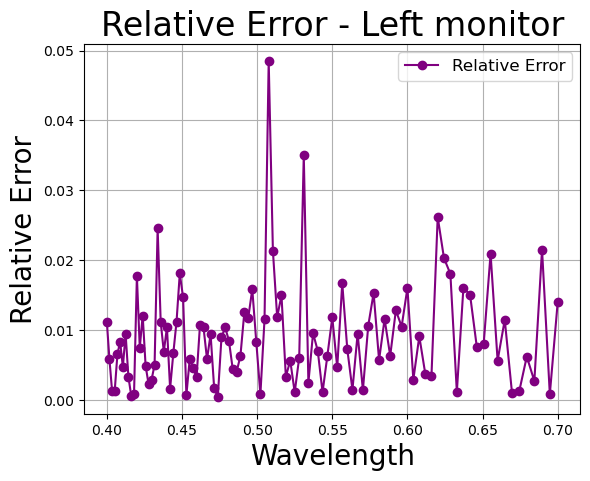

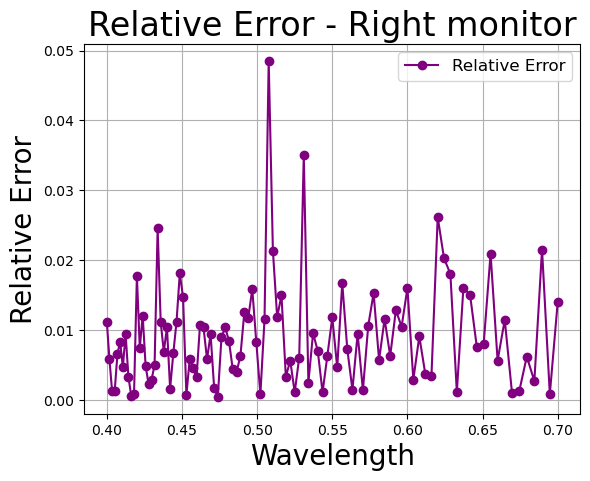

In [59]:
# ─── 공통 함수: 상대 오차 플로팅 ───
def plot_relative_error(wavelength, flux_pml, flux_abs, title):
    relative_error = np.abs((np.array(flux_pml) - np.array(flux_abs)) / np.maximum(np.abs(flux_pml), 1e-12))
    plt.figure()
    plt.plot(wavelength, relative_error, 'o-', label='Relative Error', color='purple')
    plt.title(f"Relative Error - {title}", fontsize=24)
    plt.xlabel("Wavelength", fontsize=20)
    plt.ylabel("Relative Error", fontsize=20)
    plt.grid(True)
    plt.legend(loc='upper right', fontsize=12)
    plt.show()

# ─── 각 방향별 그래프 출력 ───
plot_relative_error(wavelength, top_flux, top_flux_abs, 'Top monitor')
plot_relative_error(wavelength, bottom_flux, bottom_flux_abs, 'Bottom monitor')
plot_relative_error(wavelength, left_flux, left_flux_abs, 'Left monitor')
plot_relative_error(wavelength, right_flux, right_flux_abs, 'Right monitor')
